In [11]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import matplotlib.lines as mlines
import seaborn as sns
import sklearn
import warnings
import miceforest as mf
import xgboost as xgb
import lightgbm as lgb
import shap

from joblib import dump, load
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

from sklearn.model_selection import GridSearchCV, KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, classification_report, roc_curve, auc

from sklearn.naive_bayes import GaussianNB
from sklearn.svm import LinearSVC, SVC

from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier


from sklearn.exceptions import DataConversionWarning, FitFailedWarning, ConvergenceWarning

In [12]:
path = 'data/AirQualityUCI.csv'


data = pd.read_csv(path,sep=';')
data.drop_duplicates(inplace=True)
data.drop(columns=['Unnamed: 15', 'Unnamed: 16'], inplace=True)
data.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,"2,6",1360,150,"11,9",1046,166,1056,113,1692,1268,"13,6","48,9","0,7578"
1,10/03/2004,19.00.00,2,1292,112,"9,4",955,103,1174,92,1559,972,"13,3","47,7","0,7255"
2,10/03/2004,20.00.00,"2,2",1402,88,"9,0",939,131,1140,114,1555,1074,"11,9","54,0","0,7502"
3,10/03/2004,21.00.00,"2,2",1376,80,"9,2",948,172,1092,122,1584,1203,"11,0","60,0","0,7867"
4,10/03/2004,22.00.00,"1,6",1272,51,"6,5",836,131,1205,116,1490,1110,"11,2","59,6","0,7888"


# Data Preparation 

Here we will prepare data for the model.
<br>
<br>
We need to:
<br>
 - correct some numerical data and replace -200 values with NaN
<br>

<br>
 - take care of missing values in numerical columns (using imputer)
<br>
 - encode categorical values (one-hot-encoding because ordinal doesn seem to suit us)
<br>
 - scale numerical features (features distribution are quite Gaussian-like therefore we will use StandardScaler)
<br>
 - maybe add polynomial features (from pairplot we can see that some relations between the target and feature are non-linear)

In [13]:
comma_replace_cols = ['CO(GT)','C6H6(GT)','T','RH','AH']

for column in comma_replace_cols:
    data[column] = data[column].str.replace(',', '.').astype(float)

data = data.replace(-200, np.nan)

 - do some feature engineering (regarding date and time features)

In [14]:
data[['Day','Month', 'Year']] = data['Date'].str.split('/', expand=True)
data.drop(columns=['Day','Date'], inplace=True)

# Converting columns to numeric
data['Year'] = pd.to_numeric(data['Year'], errors='coerce', downcast='integer')
data['Month'] = pd.to_numeric(data['Month'], errors='coerce', downcast='integer')

month_names = {
    1: 'January',
    2: 'February',
    3: 'March',
    4: 'April',
    5: 'May',
    6: 'June',
    7: 'July',
    8: 'August',
    9: 'September',
    10: 'October',
    11: 'November',
    12: 'December'
}

data['Month'] = data['Month'].map(month_names)

columns = list(data.columns)
columns.insert(0, columns.pop(columns.index('Month')))
columns.insert(0, columns.pop(columns.index('Year')))
data = data[columns]
data.head()

,Year,Month,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004,March,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004,March,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2004,March,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004,March,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004,March,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [15]:
categorical_columns = data.select_dtypes(include=['int32','object', 'category']).columns.to_numpy()
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns.to_numpy()
numerical_columns = numerical_columns[numerical_columns != 'Year']
categorical_columns = np.append('Year', categorical_columns)

Splitting time into 4 categories:

In [16]:
def categorize_time(hour):
    if not pd.isnull(hour):
        hour = int(str(hour).split('.')[0])
        #hour = int(hour[:1])
        if 5 <= hour < 11:
            return 'Morning'
        elif 11 <= hour < 17:
            return 'Midday'
        elif 17 <= hour < 23:
            return 'Evening'
        else:  # For hours between 23 and 24, and 0 to 4
            return 'Night'
    else:
        return np.nan 
# Apply the categorization function to create a new column
data['time_of_day'] = data['Time'].apply(categorize_time)
data.drop(columns=['Time'], inplace=True)
categorical_columns = categorical_columns[categorical_columns != 'Time']
categorical_columns = np.append(categorical_columns, 'time_of_day')
data.head(5)

,Year,Month,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,time_of_day
0,2004,March,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,Evening
1,2004,March,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,Evening
2,2004,March,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,Evening
3,2004,March,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,Evening
4,2004,March,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,Evening


Replacing some values with polynomial functions (square and inverse) in order to increase correlation with the target.

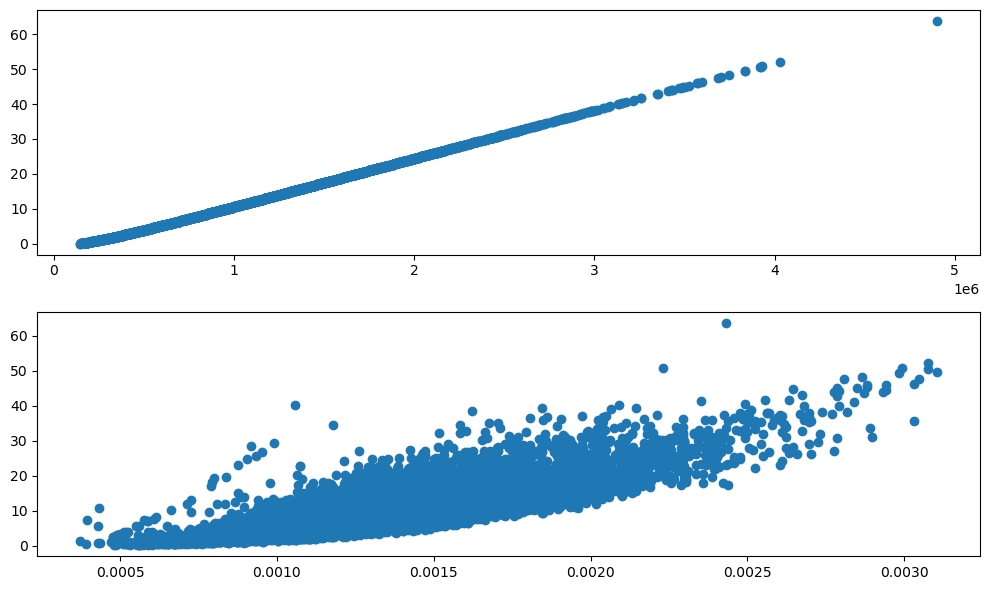

In [17]:
data['PT08.S2(NMHC)_squared'] = data['PT08.S2(NMHC)'] ** 2
data['1/PT08.S3(NOx)'] = 1 / data['PT08.S3(NOx)']

fig, ax = plt.subplots(2,figsize=(10,6))
ax[0].scatter(data['PT08.S2(NMHC)_squared'],data['C6H6(GT)'])
ax[1].scatter(data['1/PT08.S3(NOx)'],data['C6H6(GT)'])
plt.tight_layout()
plt.show()

In [18]:
drop_cols = ['PT08.S2(NMHC)', 'PT08.S3(NOx)']
#data.drop(columns=drop_cols, inplace=True)
numerical_columns = numerical_columns[numerical_columns != drop_cols[0]]
numerical_columns = numerical_columns[numerical_columns != drop_cols[1]]
numerical_columns = np.append(numerical_columns, 'PT08.S2(NMHC)_squared')
numerical_columns = np.append(numerical_columns, '1/PT08.S3(NOx)')

Dropping rows with many missing values

In [19]:
data.dropna(subset=['Year','Month','time_of_day'],inplace=True)
data = data.dropna(thresh=data.shape[1] - 5 + 1)

One-got-encoding categorical features

In [20]:
data = pd.get_dummies(data,drop_first=True,columns=categorical_columns, dtype=int)
data.head()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),...,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,time_of_day_Midday,time_of_day_Morning,time_of_day_Night
0,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,...,0,0,1,0,0,0,0,0,0,0
1,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,...,0,0,1,0,0,0,0,0,0,0
2,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,...,0,0,1,0,0,0,0,0,0,0
3,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,...,0,0,1,0,0,0,0,0,0,0
4,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,...,0,0,1,0,0,0,0,0,0,0


Splitting data into train and test sets.

In [21]:
feature_cols = data.columns
feature_cols = feature_cols[feature_cols != 'C6H6(GT)']
target_col = ['C6H6(GT)']


X = data[feature_cols]
y = data[target_col]
X = mf.utils.ampute_data(X)

X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2, random_state=42)

In this step we impute missing numerical values using Multiple Imputation by Chained Equations (MICE) algorithm. It imputs values in one column based on the rest of columns and repeat this for every column and for a desired number of iterations (cycles) over all of columns.

In [22]:
pipe_kernel = mf.ImputationKernel(X_train, datasets=1)

mice_pipe = Pipeline([
    ('impute', pipe_kernel),
])

X_train_t = mice_pipe.fit_transform(
    X_train,
    impute__iterations=2
)

X_test_t = mice_pipe.transform(X_test)

# Show that neither now have missing values.
assert not np.any(np.isnan(X_train_t))
assert not np.any(np.isnan(X_test_t))

Scaling the numerical features using standard scales. We assume that our features come from a distribution close to a Gaussian.

In [23]:
numeric_transformer     = Pipeline([
('std_scaler', StandardScaler())
#('poly-features', PolynomialFeatures(degree=2))
])

numerical_columns_for_transformation = numerical_columns[numerical_columns != 'C6H6(GT)']

preprocessor            = ColumnTransformer([
    ('numeric_preprocess', numeric_transformer, numerical_columns_for_transformation),
]  , remainder='passthrough')


X_train_t = preprocessor.fit_transform(X_train_t)
X_test_t = preprocessor.transform(X_test_t)


In [24]:
X_train = pd.DataFrame(X_train_t, columns=feature_cols)
X_test = pd.DataFrame(X_test_t, columns=feature_cols)

X_train.head()

,CO(GT),PT08.S1(CO),NMHC(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,...,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,time_of_day_Midday,time_of_day_Morning,time_of_day_Night
0,-1.104006,-1.343459,-0.809976,-0.938450,-1.625758,-0.365991,-1.482008,1.617169,-1.331222,0.557706,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.321374,-0.458102,0.274333,-0.131048,0.249712,0.945057,0.101703,1.503547,-1.459369,0.178097,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.676392,-0.597163,-0.790117,-0.851025,-0.610798,-0.603836,-1.205047,-0.689369,-0.137121,-0.891463,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.676392,-0.796485,-0.710680,-0.768742,-1.030021,0.196715,-0.698965,0.583204,0.532740,1.587790,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,-0.106240,0.014706,0.234615,1.334619,1.860410,-1.024416,0.882228,-0.700732,-1.115701,-1.497497,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


In [25]:
X_train.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)
#X_valid.reset_index(drop=True, inplace=True)
#y_valid.reset_index(drop=True, inplace=True)
X_test.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)

# REGRESSION PROBLEM

## Model training

Lets create function for hyperparameter tuning:

In [3]:
def hyperparameter_tuning_reg(X_train, y_train, X_test, y_test, model_type, param_grid, cv, verb=1):

    warnings.filterwarnings(action='ignore', category=DataConversionWarning)
    warnings.filterwarnings(action='ignore', category=UserWarning)
    warnings.filterwarnings(action='ignore', category=FitFailedWarning)
    warnings.filterwarnings(action='ignore', category=ConvergenceWarning)
    warnings.filterwarnings(action='ignore', category=FutureWarning)

    if model_type == 'dec_tree':
        model = DecisionTreeRegressor()
    elif model_type == 'rand_forest':
        model = RandomForestRegressor()
    elif model_type == 'boosting':
        model = lgb.LGBMRegressor(verbose=0)
    else:
        raise ValueError("Invalid model type provided.")

    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='neg_root_mean_squared_error', cv=cv, verbose=verb)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_model = model.set_params(**best_params)
    best_model.fit(X_train, y_train)

    y_pred = best_model.predict(X_test.values)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)

    print("Regression Report:\nRMSE = ", rmse, "\nR2 score = ", r2)
    print("Best parameters: ", best_params)

    return best_model, best_params

In [4]:
def save_model_reg(model, name):
        dump(model, f'{name}.joblib')

In [5]:
def load_model_reg(name):
    model = load(f'{name}.joblib')
    return model

In [39]:
def generate_param_grid(param_value, n_points = 5):
    if param_value is None:
        return [None]
    elif isinstance(param_value, bool):
        return [param_value]
    elif isinstance(param_value, int):
        return np.linspace(int(0.8 * param_value), int(1.2 * param_value), num=n_points, endpoint=True, dtype=int)
    elif isinstance(param_value, float): 
        return np.linspace((0.8 * param_value), (1.2 * param_value), num=n_points, endpoint=True)
    else:
        return [param_value]

### Decision Tree Regressor

Setting max_depth as well as max_leaf_nodes is a way of preventing our model from ovefitting the data. Similarily min_sample is set to make sure that we dont split our data if its just to bring information about small number of samples.

In [42]:
tree_reg_param_grid = {
    'max_depth': [None, 5, 10, 20],
    'max_leaf_nodes': [None, 50, 200, 500],
    'min_samples_split': [2, 10, 30]
}

tree, params = hyperparameter_tuning_reg(X_train, y_train, X_test, y_test, 'dec_tree', tree_reg_param_grid, 5)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Regression Report:
RMSE =  0.733239017117749 
R2 score =  0.9906435931049826
Best parameters:  {'max_depth': None, 'max_leaf_nodes': 500, 'min_samples_split': 10}


And now we'll conduct a little bit more precise hyperparameter tuning based on the best parameters found in the first one.

In [43]:
tree_reg_param_grid_v2 = {
    'max_depth': generate_param_grid(params['max_depth']),
    'max_leaf_nodes': generate_param_grid(params['max_leaf_nodes']),
    'min_samples_split': generate_param_grid(params['min_samples_split'])
}

tree, tree_params = hyperparameter_tuning_reg(X_train, y_train, X_test, y_test, 'dec_tree', tree_reg_param_grid_v2, 5)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
Regression Report:
RMSE =  0.7332067425958675 
R2 score =  0.9906444167570418
Best parameters:  {'max_depth': None, 'max_leaf_nodes': 450, 'min_samples_split': 8}


In [44]:
save_model_reg(tree, 'all_features_reg_tree')

In [45]:
if 'tree' not in locals():
    tree = load_model_reg('all_features_reg_tree')
    print("Model loaded successfully!")
else:
    print("Model already exists in 'tree' variable.")

Model already exists in 'tree' variable.


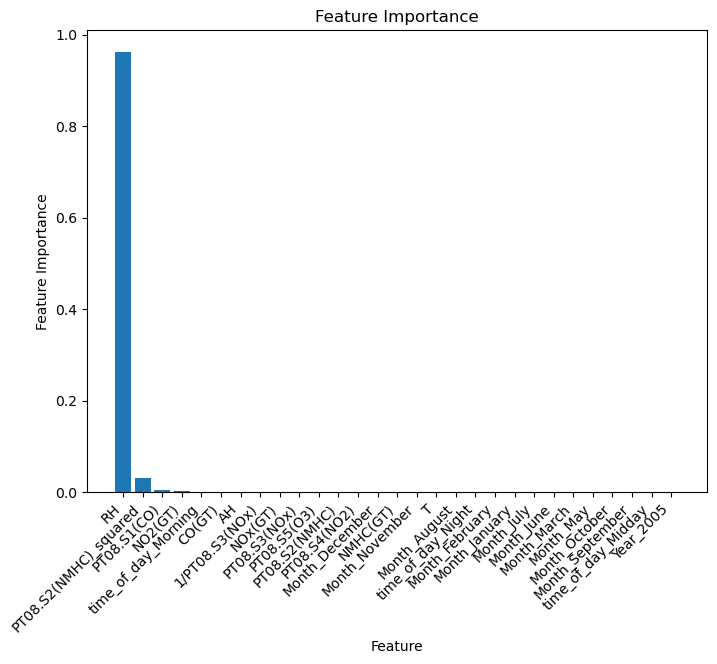

In [46]:
feature_importance = tree.feature_importances_

# Sort feature importances in descending order
sorted_indices = feature_importance.argsort()[::-1]

# Plotting feature importances
plt.figure(figsize=(8, 6))
plt.bar(range(X_train.shape[1]), feature_importance[sorted_indices], align='center')
plt.xticks(range(X_train.shape[1]), [f"{feature_cols[i]}" for i in sorted_indices],  rotation=45, ha='right')
plt.xlabel('Feature')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

It looks like only one, maybe two features has a significant influence on our tree. Lets try to build a model based only on them and see if it will change its performance.

In [50]:
significant_features = [f"{feature_cols[i]}" for i in sorted_indices if feature_importance[i]>0.01]
significant_features

['RH', 'PT08.S2(NMHC)_squared']

In [53]:
tree2, tree_params = hyperparameter_tuning_reg(X_train[significant_features], y_train, X_test[significant_features], y_test, 'dec_tree', tree_reg_param_grid, 5)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Regression Report:
RMSE =  0.6294816461164378 
R2 score =  0.9931042086735208
Best parameters:  {'max_depth': 10, 'max_leaf_nodes': 2000, 'min_samples_split': 5}


And now we'll conduct a little bit more precise hyperparameter tuning based on the best parameters found in the first one.

In [54]:
tree_reg_param_grid_v2 = {
    'max_depth': generate_param_grid(tree_params['max_depth']),
    'max_leaf_nodes': generate_param_grid(tree_params['max_leaf_nodes']),
    'min_samples_split': generate_param_grid(tree_params['min_samples_split'])
}
tree2, params = hyperparameter_tuning_reg(X_train[significant_features], y_train, X_test[significant_features], y_test, 'dec_tree', tree_reg_param_grid_v2, 5)

Fitting 5 folds for each of 1331 candidates, totalling 6655 fits
Regression Report:
RMSE =  0.6321374786666729 
R2 score =  0.993045898152723
Best parameters:  {'max_depth': 9, 'max_leaf_nodes': 2080, 'min_samples_split': 5}


In [55]:
save_model_reg(tree2, 'significant_features_reg_tree')

In [8]:
if 'tree2' not in locals():
    tree2 = load_model_reg('significant_features_reg_tree')
    print("Model loaded successfully!")
else:
    print("Model already exists in 'tree' variable.")

Model loaded successfully!


Lets try to visualize our tree.

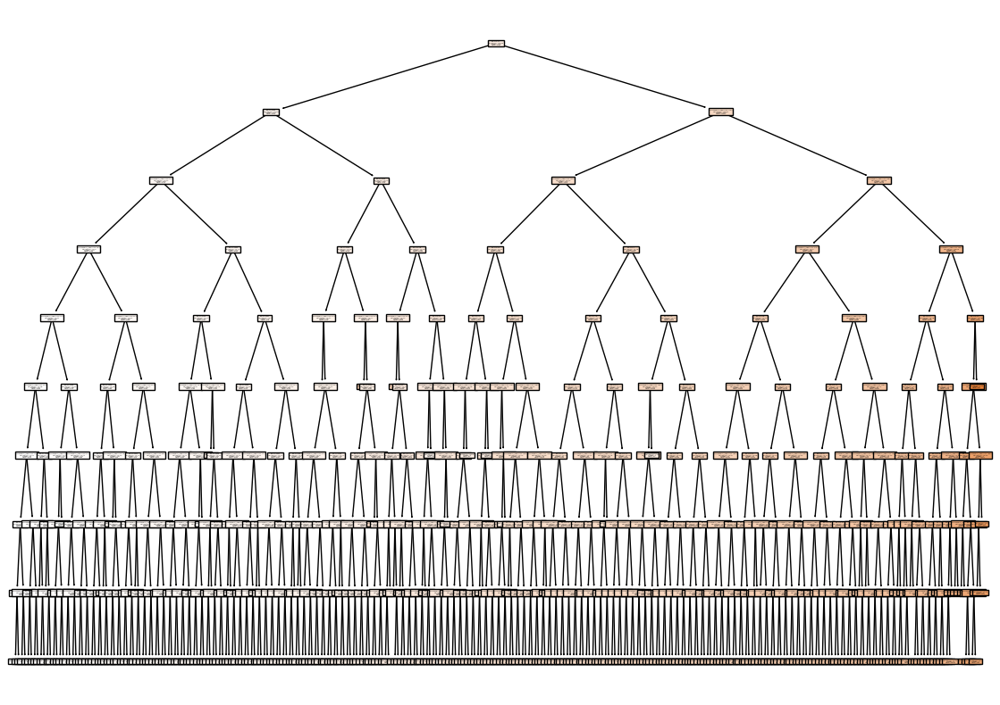

In [57]:
plt.figure(figsize=(14, 10))
sklearn.tree.plot_tree(tree2, feature_names=significant_features, filled=True)
plt.show()

Well its definitely too big for us to be able to extract any information from the visualization. Lets try to visualize first 3 levels of the tree:

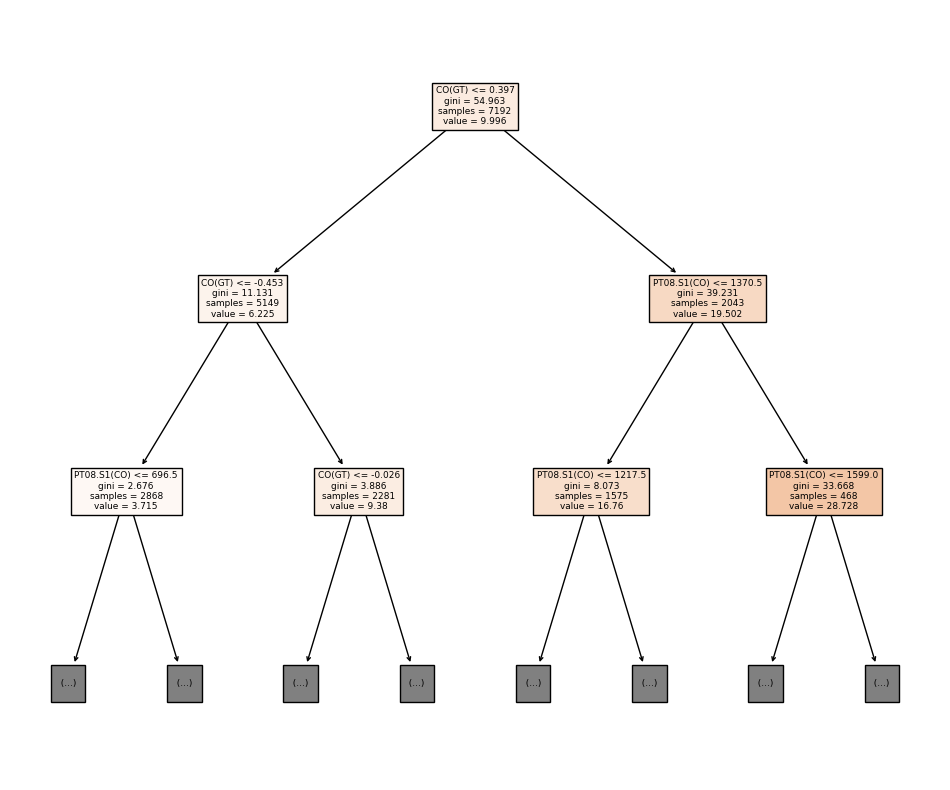

In [32]:
from io import StringIO

# Create a shallow tree with max depth of 3
shallow_tree = DecisionTreeClassifier(max_depth=3)
shallow_tree.tree_ = tree2.tree_  # Copy the structure of the deeper tree

dot_data = StringIO()
plt.figure(figsize=(12,10))
plot_tree(shallow_tree, max_depth=2,filled=True, feature_names=list(X_train.columns), class_names=list(y_train.columns))

plt.show()

Now we can see the top (or rather bottom since it starts from the root) of our tree. We see for each split what is the decrease in gini impurity, what feature and what value of it is the split based on, how many samples went through that node and what value it assigns to them.

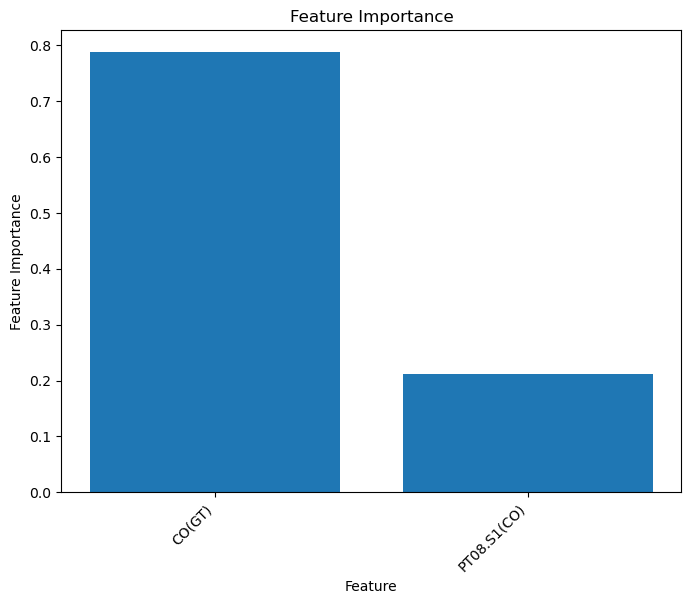

In [51]:
feature_importance = tree2.feature_importances_

# Sort feature importances in descending order
sorted_indices = feature_importance.argsort()[::-1]

# Plotting feature importances
plt.figure(figsize=(8, 6))
plt.bar(range(len(significant_features)), feature_importance[sorted_indices], align='center')
plt.xticks(range(len(significant_features)), [f"{feature_cols[i]}" for i in sorted_indices],  rotation=45, ha='right')
plt.xlabel('Feature')
plt.ylabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

Lets get some insight into interpretation of our tree predictions with help of SHAP library.

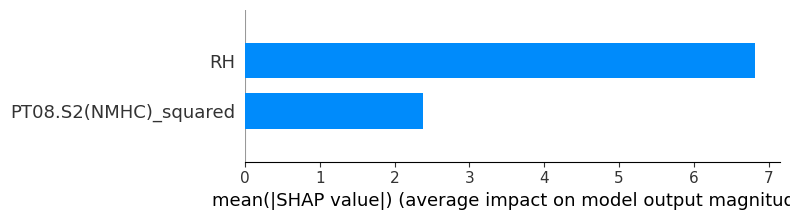

In [52]:
tree_explainer = shap.TreeExplainer(
    tree2, X_train[significant_features], feature_names=X_train[significant_features].columns.tolist()
)

shap_values = tree_explainer.shap_values(X_train[significant_features], y_train)

shap.summary_plot(shap_values, X_train[significant_features], plot_type="bar")

### Random Forest Regressor

Parameters max_depth and min_sample_split describe the same thing as in the simple decision_tree because they set some upper threshold for those values in each decision tree that will be a part of our forest. N_estimators describes how many trees we will train, max_features describes how big percent of all available features will a single tree consider. Oob_score set to True tells the model to evaluate each model on the data that wasnt chosen for the training.

In [64]:
forest_reg_param_grid = {
    'max_depth': [None, 5, 8, 10, 15],
    'n_estimators': [10, 20, 50, 100],
    'min_samples_split': [2, 5, 10, 20],
    'max_features': [0.3,0.5,0.8,1.0],
    'oob_score': [True, False]
}

forest, forest_params = hyperparameter_tuning_reg(X_train, y_train, X_test, y_test, 'rand_forest', forest_reg_param_grid, 4)

Fitting 4 folds for each of 640 candidates, totalling 2560 fits
[CV] END max_depth=None, max_features=0.3, min_samples_split=2, n_estimators=10, oob_score=True; total time=   0.7s
[CV] END max_depth=None, max_features=0.3, min_samples_split=2, n_estimators=10, oob_score=True; total time=   0.6s
[CV] END max_depth=None, max_features=0.3, min_samples_split=2, n_estimators=10, oob_score=True; total time=   0.6s
[CV] END max_depth=None, max_features=0.3, min_samples_split=2, n_estimators=10, oob_score=True; total time=   0.6s
[CV] END max_depth=None, max_features=0.3, min_samples_split=2, n_estimators=10, oob_score=False; total time=   0.6s
[CV] END max_depth=None, max_features=0.3, min_samples_split=2, n_estimators=10, oob_score=False; total time=   0.6s
[CV] END max_depth=None, max_features=0.3, min_samples_split=2, n_estimators=10, oob_score=False; total time=   0.6s
[CV] END max_depth=None, max_features=0.3, min_samples_split=2, n_estimators=10, oob_score=False; total time=   0.6s
[CV]

In [65]:
save_model_reg(forest, 'random_forest_reg')

In [ ]:
if 'forest' not in locals():
    forest = load_model_reg('random_forest_reg')
    print("Model loaded successfully!")
else:
    print("Model already exists in 'tree' variable.")

In [72]:
forest_reg_param_grid_v2 = {
    'max_depth': generate_param_grid(forest_params['max_depth'], 5),
    'n_estimators': generate_param_grid(forest_params['n_estimators'], 5),
    'min_samples_split': generate_param_grid(forest_params['min_samples_split'], 5),
    'max_features': generate_param_grid(forest_params['max_features'], 5),
    'oob_score': generate_param_grid(forest_params['oob_score'])
}

forest2, forest_params2 = hyperparameter_tuning_reg(X_train, y_train, X_test, y_test, 'rand_forest', forest_reg_param_grid_v2, 4)

Fitting 4 folds for each of 125 candidates, totalling 500 fits
[CV] END max_depth=None, max_features=0.24, min_samples_split=1, n_estimators=80, oob_score=True; total time=   0.0s
[CV] END max_depth=None, max_features=0.24, min_samples_split=1, n_estimators=80, oob_score=True; total time=   0.0s
[CV] END max_depth=None, max_features=0.24, min_samples_split=1, n_estimators=80, oob_score=True; total time=   0.0s
[CV] END max_depth=None, max_features=0.24, min_samples_split=1, n_estimators=80, oob_score=True; total time=   0.0s
[CV] END max_depth=None, max_features=0.24, min_samples_split=1, n_estimators=90, oob_score=True; total time=   0.0s
[CV] END max_depth=None, max_features=0.24, min_samples_split=1, n_estimators=90, oob_score=True; total time=   0.0s
[CV] END max_depth=None, max_features=0.24, min_samples_split=1, n_estimators=90, oob_score=True; total time=   0.0s
[CV] END max_depth=None, max_features=0.24, min_samples_split=1, n_estimators=90, oob_score=True; total time=   0.0s
[

In [73]:
save_model_reg(forest2, 'random_forest2_reg')

In [ ]:
if 'forest2' not in locals():
    forest2 = load_model_reg('random_forest2_reg')
    print("Model loaded successfully!")
else:
    print("Model already exists in 'tree' variable.")

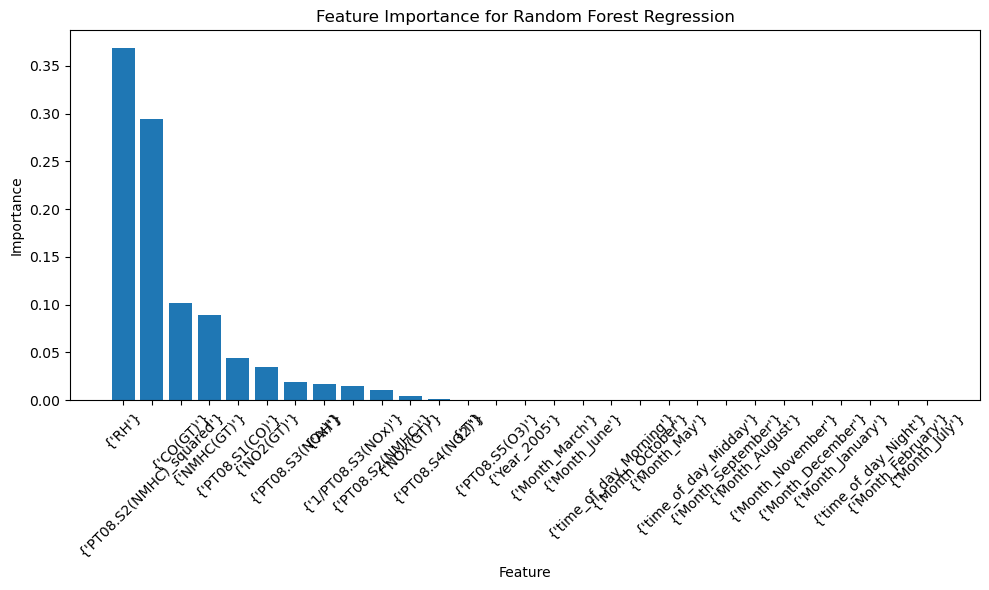

In [74]:
feature_importance = forest2.feature_importances_

# Sort feature importance in descending order
sorted_indices = feature_importance.argsort()[::-1]
sorted_importance = feature_importance[sorted_indices]
sorted_features = [{feature_cols[i]} for i in sorted_indices]

# Plotting feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(X.shape[1]), sorted_importance, align='center')
plt.xticks(range(X.shape[1]), sorted_features, rotation=45)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importance for Random Forest Regression')
plt.tight_layout()
plt.show()

### LightGBM

In [ ]:
#train_data = lgb.Dataset(X_train, label=y_train)
#test_data = lgb.Dataset(X_test, label=y_test, reference=train_data)

In [28]:
lgb_param_grid = {
    'learning_rate': [0.01, 0.05, 0.1], 
    'n_estimators': [20, 50, 100, 150],         
    'max_depth': [None, 5, 10],
    'reg_alpha': [0.0, 0.1, 0.5],  
    'reg_lambda': [0.0, 0.1, 0.5],
    'num_leaves': [20, 30, 40, 50]
}

booster, lgbm_params = hyperparameter_tuning_reg(X_train, y_train, X_test, y_test, 'boosting', lgb_param_grid, 5, 1)

Fitting 5 folds for each of 1296 candidates, totalling 6480 fits
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

In [29]:
save_model_reg(booster, 'lgbm_booster_reg')

In [ ]:
if 'booster' not in locals():
    booster = load_model_reg('lgbm_booster_reg')
    print("Model loaded successfully!")
else:
    print("Model already exists in 'tree' variable.")

In [35]:
lgb_param_grid2 = {
    'learning_rate': generate_param_grid(lgbm_params['learning_rate'], 3),
    'max_depth': [None, 12, 15],
    'n_estimators': generate_param_grid(lgbm_params['n_estimators'], 3),
    'num_leaves': generate_param_grid(lgbm_params['num_leaves'], 5),
    'reg_alpha': generate_param_grid(lgbm_params['reg_alpha'], 3),
    'reg_lambda': [lgbm_params['reg_lambda']],
    
}

booster2, lgbm_params2 = hyperparameter_tuning_reg(X_train, y_train, X_test, y_test, 'boosting', lgb_param_grid2, 5, 1)

Fitting 5 folds for each of 405 candidates, totalling 2025 fits
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

In [36]:
save_model_reg(booster2, 'lgbm_booster_reg2')

In [ ]:
if 'booster2' not in locals():
    booster2 = load_model_reg('lgbm_booster_reg2')
    print("Model loaded successfully!")
else:
    print("Model already exists in 'tree' variable.")

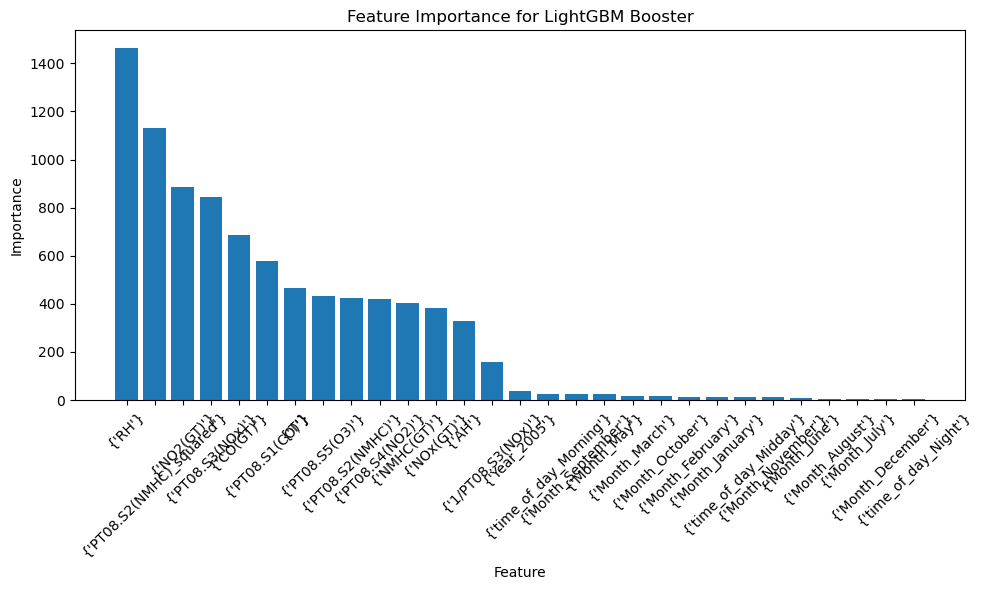

In [38]:
feature_importance = booster2.feature_importances_

# Sort feature importance in descending order
sorted_indices = feature_importance.argsort()[::-1]
sorted_importance = feature_importance[sorted_indices]
sorted_features = [{feature_cols[i]} for i in sorted_indices]

# Plotting feature importance
plt.figure(figsize=(10, 6))
plt.bar(range(X.shape[1]), sorted_importance, align='center')
plt.xticks(range(X.shape[1]), sorted_features, rotation=45)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importance for LightGBM Booster')
plt.tight_layout()
plt.show()

### CONCLUSIONS

Overall our models reached r2 scores, and rmse:
 - decision tree ->                        0.993,  0.632
 - random forest ->                        0.995,  0.514
 - lgbm gradient boosting algorithm ->     0.996,  0.453 


Compared to the results of the last homework (mse was 0.493 what gices rmse = 0.701):
 - linear regression ->                    0.991,  0.701


We can see that lgbm gradient boosting performed the best from those models and with more sophisticated tuning it would probably be even better. Random forest performance was also very good. Even simplest decision tree was better than linear regression.
<br>
Looking at all of the investigated models, gradient boosting seems to be the best approach to our problem, however its important to be careful not to overfit the model. It explained data the best and achieved the lowest rmse.